In [1]:
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
import traceback
from math import atan2, asin, degrees

In [2]:
CAMERA = 'dslr'
CALIBRATION_PATH = './calibration'
PATH = './find_pose'
CAMERA_CALIBRATION = f'{CALIBRATION_PATH}/{CAMERA}/calib_data_{CAMERA}.npz'


# TOP, BOTTOM, LEFT, RIGHT = 120, 380, 70, 500
# THRESHOLD = 127
# TEXT_SIZE = 0.6

TOP, BOTTOM, LEFT, RIGHT = 500, 1300, 600, 2500
THRESHOLD = 80
MAX_IOU_ERROR = 0.2
TEXT_SIZE = 3

In [3]:
# Plate3
obj_pts = np.array([
    [0,0, 0],
    [0,35, 0],
    [100,35, 0],
    [100, 19, 0],
], dtype=np.float32)

In [4]:
data = np.load(CAMERA_CALIBRATION)
camera_matrix = data['camera_matrix']
dist_coeffs = data['dist_coeffs']

print(camera_matrix)

[[2.24755274e+03 0.00000000e+00 1.23434660e+03]
 [0.00000000e+00 2.27349711e+03 8.86374521e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [5]:
def rotationMatrixToRPY(R):
    sy = np.sqrt(R[0,0]**2 + R[1,0]**2)
    singular = sy < 1e-6
    if not singular:
        x = atan2(R[2,1], R[2,2])
        y = atan2(-R[2,0], sy)
        z = atan2(R[1,0], R[0,0])
    else:
        x = atan2(-R[1,2], R[1,1])
        y = atan2(-R[2,0], sy)
        z = 0
    return degrees(x), degrees(y), degrees(z)

def rotations_and_flips(points):
    n = len(points)
    for shift in range(n):
        yield np.roll(points, shift, axis=0)
        yield np.flip(np.roll(points, shift, axis=0), axis=0)

./find_pose/dslr/IMG_9496.JPG


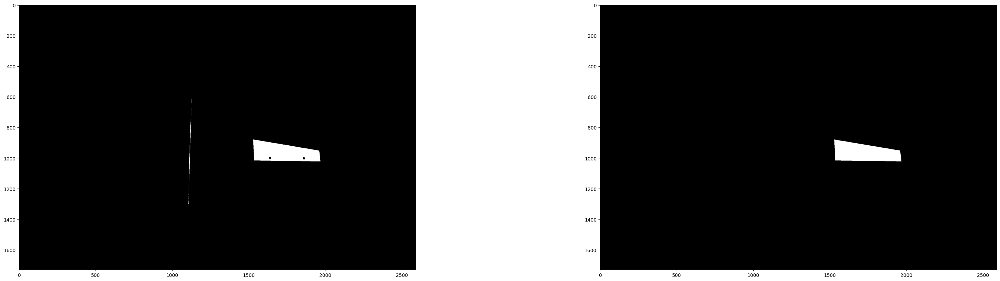

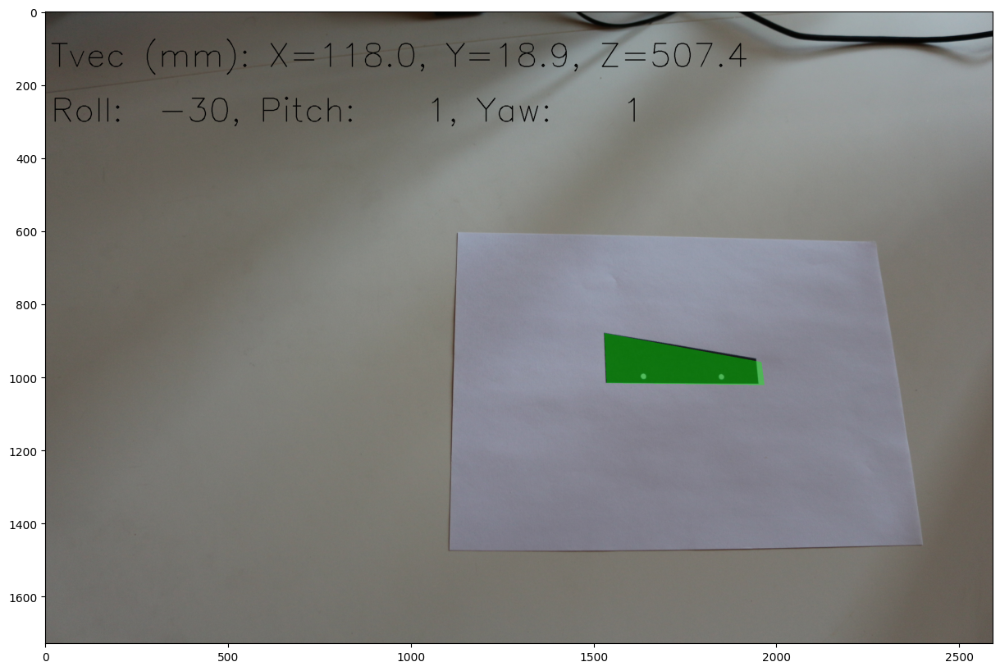

./find_pose/dslr/IMG_9497.JPG


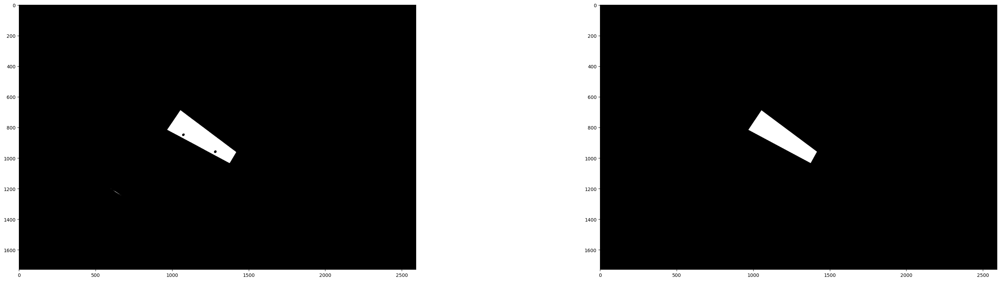

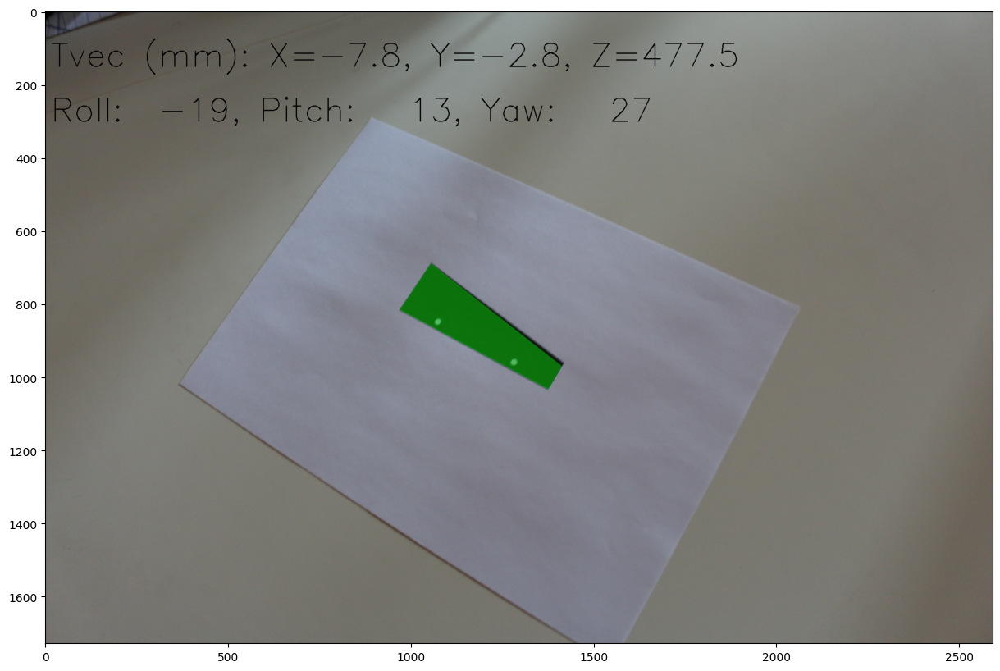

./find_pose/dslr/IMG_9499.JPG


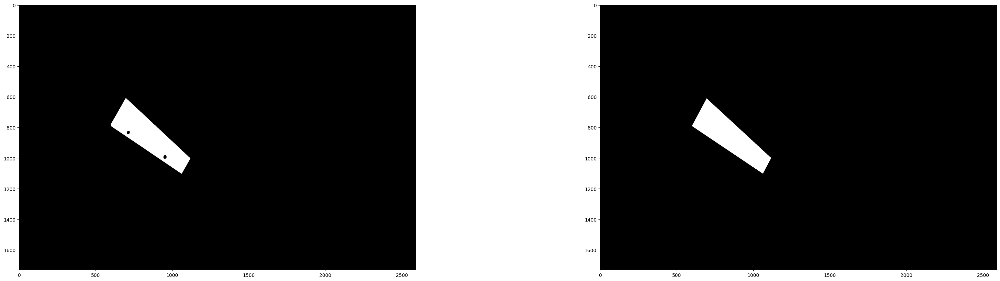

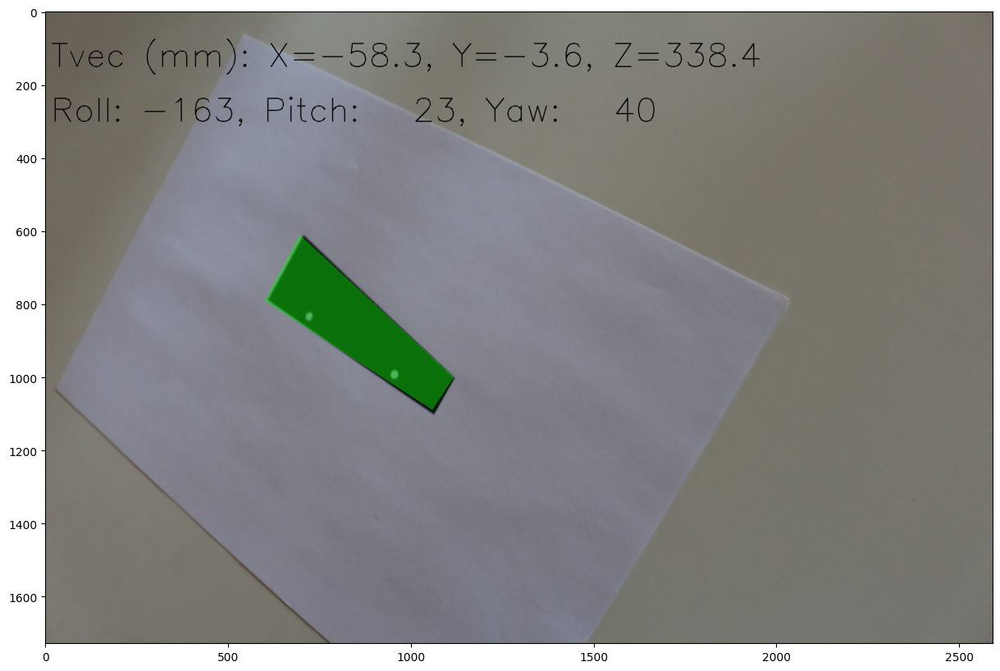

./find_pose/dslr/IMG_9495.JPG


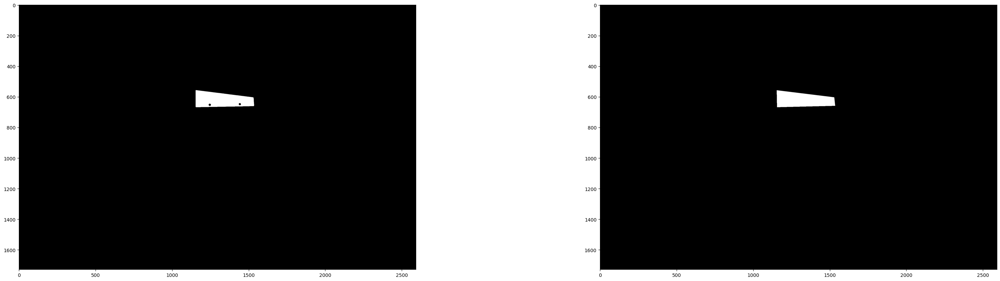

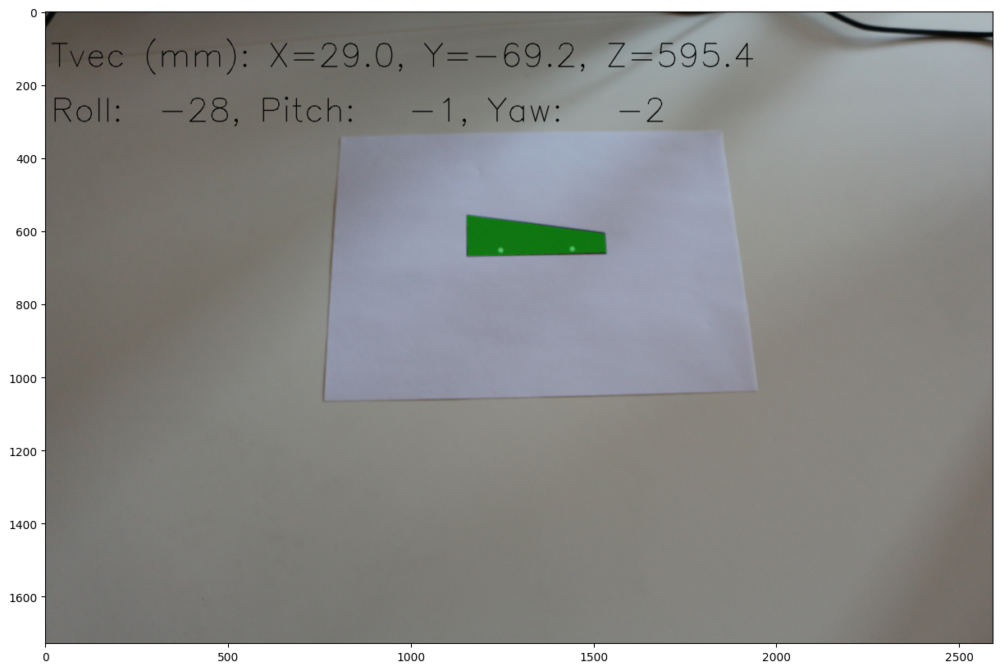

./find_pose/dslr/IMG_9493.JPG


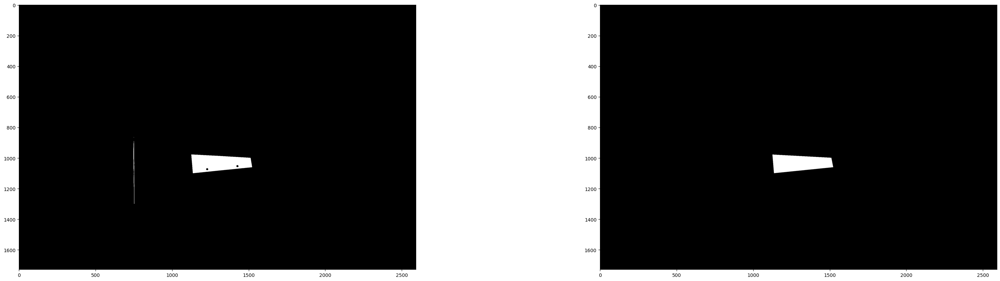

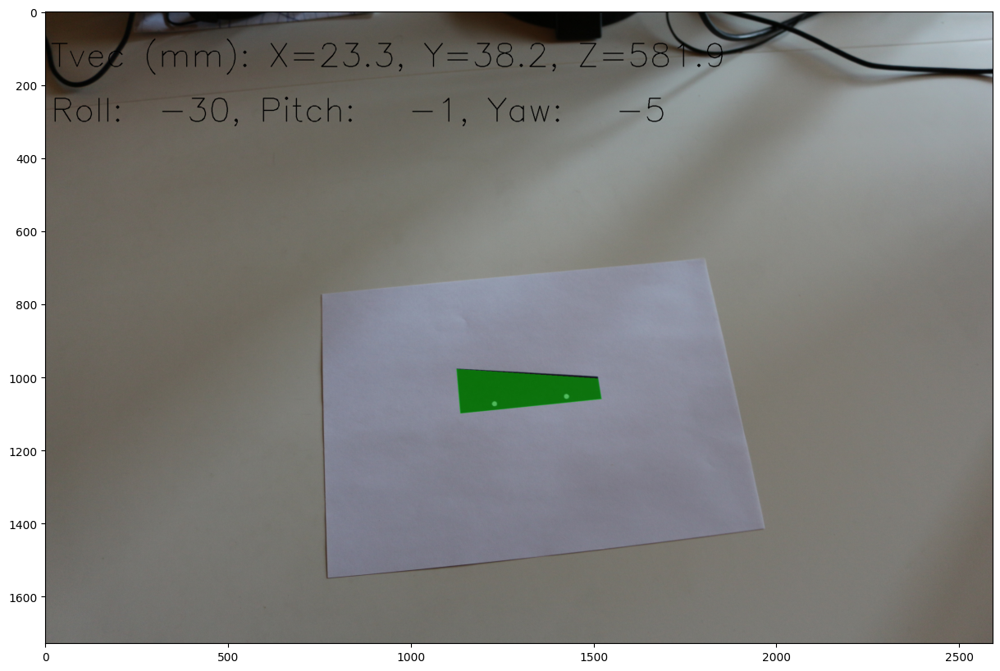

./find_pose/dslr/IMG_9500.JPG


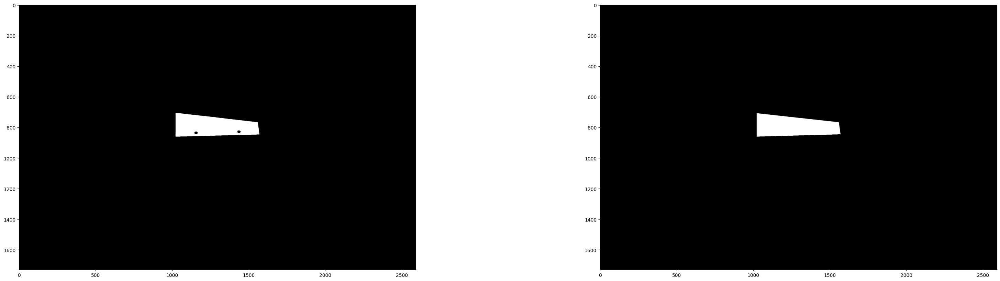

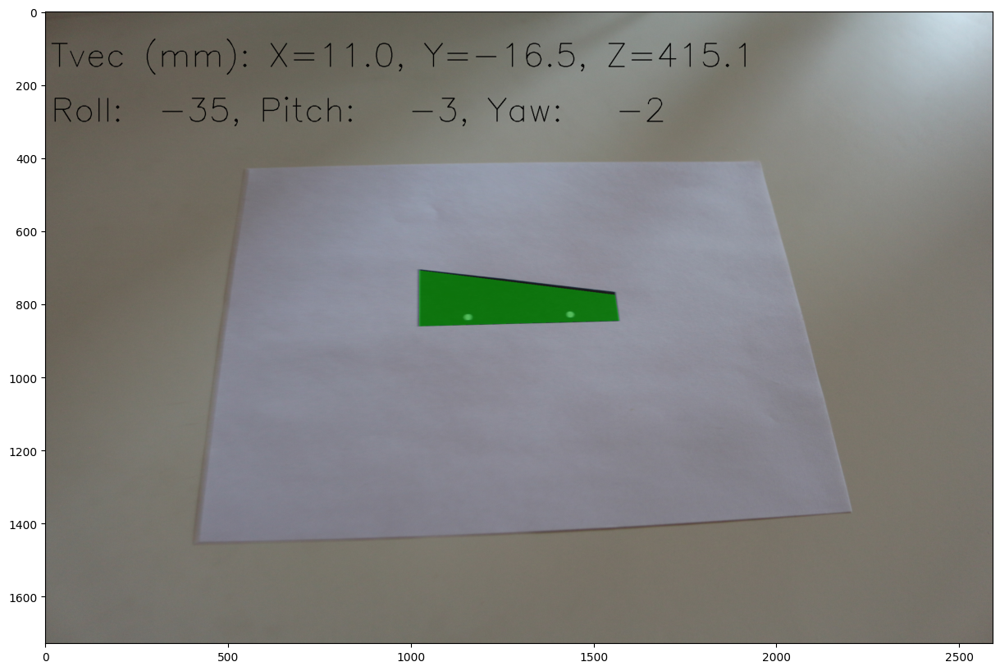

./find_pose/dslr/IMG_9498.JPG


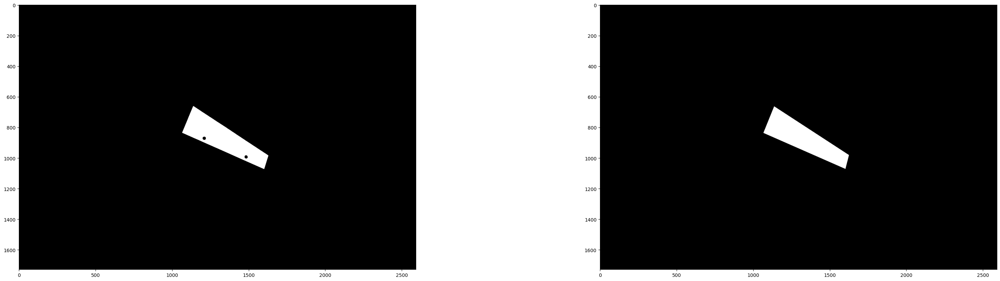

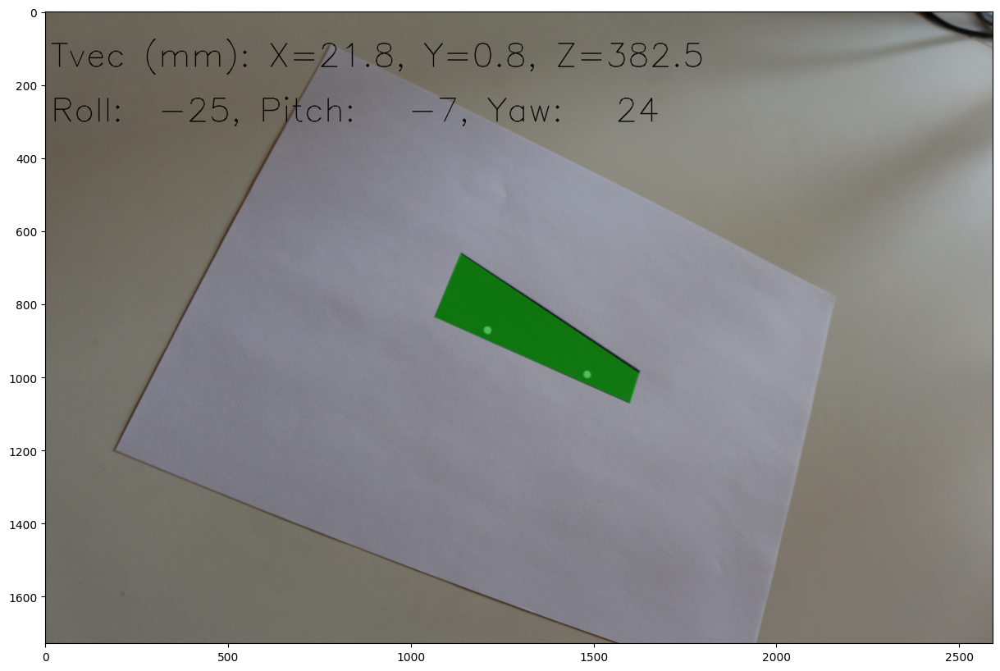

./find_pose/dslr/IMG_9494.JPG


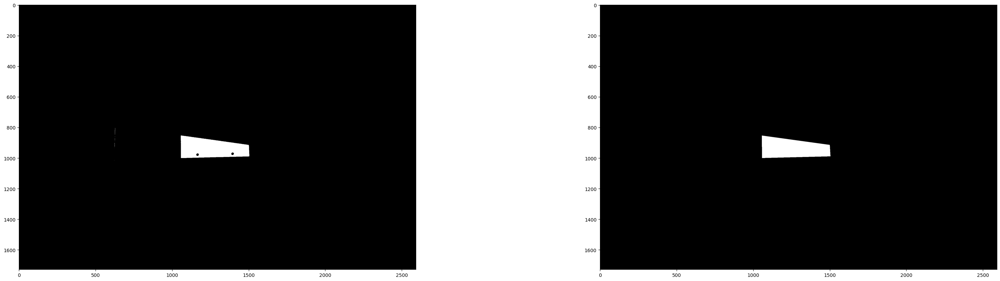

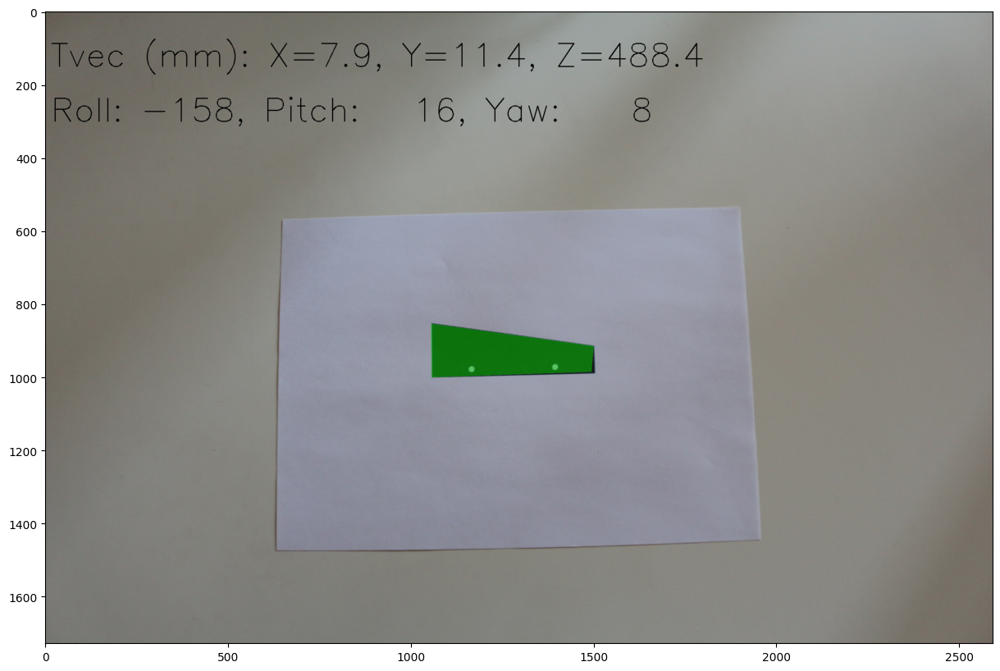

In [6]:
for image_path in glob.glob(f'{PATH}/{CAMERA}/*'):
    print(image_path)
    frame = cv2.imread(image_path)

    processed = frame.copy()
    frame_grayscale = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    undistorted = cv2.undistort(frame_grayscale, camera_matrix, dist_coeffs)

    cropped = 255 * np.ones(undistorted.shape, dtype=np.uint8)
    cropped[TOP:BOTTOM, LEFT:RIGHT] = undistorted[TOP:BOTTOM, LEFT:RIGHT]

    _, binary = cv2.threshold(cropped, THRESHOLD, 255, cv2.THRESH_BINARY)
    binary = 255 - binary

    try:
        cnts, _ = cv2.findContours(
            binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if len(cnts) > 0:
            cnt = max(cnts, key=cv2.contourArea)
            epsilon = 0.02 * cv2.arcLength(cnt, True)
            approx = cv2.approxPolyDP(cnt, epsilon, True)
            img_pts = approx.reshape(-1, 2).astype(np.float32)
            contour_to_draw = approx  # shape: (N,1,2)
            contour = np.zeros(frame_grayscale.shape, dtype=np.uint8)
            cv2.drawContours(contour, [contour_to_draw], -1, 255, -1)
            
            plt.figure(figsize=(40,10))
            plt.subplot(121)
            plt.imshow(binary, 'gray')
            plt.subplot(122)
            plt.imshow(contour, 'gray')

            best_error = float('inf')
            best_rvec, best_tvec = None, None
            for candidate_points in rotations_and_flips(img_pts):
                success = False
                try:
                    success, rvec, tvec, inliers = cv2.solvePnPRansac(
                        objectPoints=obj_pts,
                        imagePoints=candidate_points,
                        cameraMatrix=camera_matrix,
                        distCoeffs=dist_coeffs,
                        reprojectionError=0.5,
                        confidence=0.99,
                        flags=cv2.SOLVEPNP_ITERATIVE
                    )
                except Exception as x:
                    pass
                    # traceback.print_exception(x)
                if success:
                    proj, _ = cv2.projectPoints(
                        obj_pts, rvec, tvec, camera_matrix, dist_coeffs)
                    proj = proj.squeeze().astype(np.int32)
                    mask_proj = np.zeros(binary.shape, dtype=np.uint8)
                    cv2.fillPoly(mask_proj, [proj], 255)
                    intersection = np.logical_and(
                        mask_proj > 0, contour > 0).sum()
                    union = np.logical_or(mask_proj > 0, contour > 0).sum()
                    iou = intersection / union if union > 0 else 0
                    error = 1 - iou
                    if error < best_error:
                        best_error = error
                        best_rvec, best_tvec = rvec.copy(), tvec.copy()

            rvec = best_rvec
            tvec = best_tvec

            if best_error < MAX_IOU_ERROR:
                # Text info
                R, _ = cv2.Rodrigues(rvec)
                point_in_cam = R @ np.mean(obj_pts,
                                           axis=0).reshape(3, 1) + tvec
                tx, ty, tz = tuple(point_in_cam.flatten())
                text = f'Tvec (mm): X={tx:.1f}, Y={ty:.1f}, Z={tz:.1f}'
                cv2.putText(processed, text, (15,  int(TEXT_SIZE / 0.1 * 5)), cv2.FONT_HERSHEY_SIMPLEX,
                            TEXT_SIZE, (0, 0, 0), 2)
                roll, pitch, yaw = rotationMatrixToRPY(R)
                text = f'Tvec (mm): X={tx:.1f}, Y={ty:.1f}, Z={tz:.1f}'
                cv2.putText(processed, f'Roll: {roll:4.0f}, Pitch: {pitch:4.0f}, Yaw: {yaw:4.0f}',
                            (15,  int(TEXT_SIZE / 0.1 * 10)), cv2.FONT_HERSHEY_SIMPLEX, TEXT_SIZE, (0, 0, 0), 2)

                # Object overlay
                img_points_proj, _ = cv2.projectPoints(
                    obj_pts, rvec, tvec, camera_matrix, dist_coeffs)
                pts = np.int32(img_points_proj).reshape(-1, 2)
                overlay = processed.copy()
                cv2.fillPoly(overlay, [pts], (0, 255, 0))
                alpha = 0.4
                processed = cv2.addWeighted(
                    overlay, alpha, processed, 1 - alpha, 0)

        plt.figure(figsize=(40,10))
        plt.imshow(cv2.cvtColor(processed, cv2.COLOR_BGR2RGB))
        plt.show()

    except Exception as x:
        pass
        #traceback.print_exception(x)